In [2]:
# Import required libraries
import pandas as pd
import numpy as np
import pandas_profiling as pp
pd.set_option('display.max_columns', 50)
pd.set_option('display.float_format', lambda x: '%.3f' %x)
from IPython.display import Image


# For date manipulation 
from datetime import datetime 

# For Visualization : matplotlib 
import matplotlib.pyplot as plt
from IPython.core.pylabtools import figsize
%matplotlib inline

# For visualization : seaborn 
import seaborn as sns
sns.set_context(font_scale=2)

# For visualization : plotly 
import plotly.offline as plty 
plty.init_notebook_mode()
import plotly.graph_objects as go 
import plotly.express as px 
import plotly.figure_factory as ff 
from plotly.subplots import make_subplots 



### Data Engineering and Exploratory Data Anaylsis 

In [3]:
train = pd.read_csv('train.csv',parse_dates=['timestamp'])  # (20216100, 4)

In [4]:
train.head()

,building_id,meter,timestamp,meter_reading
0,0,0,2016-01-01,0.000
1,1,0,2016-01-01,0.000
2,2,0,2016-01-01,0.000
3,3,0,2016-01-01,0.000
4,4,0,2016-01-01,0.000


In [5]:
train['meter'].value_counts()

0    12060910
1     4182440
2     2708713
3     1264037
Name: meter, dtype: int64

In [6]:
building_metadata = pd.read_csv('building_metadata.csv')  # (1449, 6)

In [7]:
building_metadata.iloc[100:110]

,site_id,building_id,primary_use,square_feet,year_built,floor_count
100,0,100,Lodging/residential,24456,1968.000,nan
101,0,101,Office,18860,1986.000,nan
102,0,102,Office,15876,1983.000,nan
103,0,103,Education,21657,2016.000,nan
104,0,104,Office,45330,2003.000,nan
105,1,105,Education,50623,nan,5.000
106,1,106,Education,5374,nan,4.000
107,1,107,Education,97532,2005.000,10.000
108,1,108,Education,81580,1913.000,5.000
109,1,109,Education,56995,1953.000,6.000


In [8]:
building_metadata['site_id'].value_counts().sort_index()

0     105
1      51
2     135
3     274
4      91
5      89
6      44
7      15
8      70
9     124
10     30
11      5
12     36
13    154
14    102
15    124
Name: site_id, dtype: int64

In [9]:
building_metadata['primary_use'].value_counts().sort_values()

Religious worship                  3
Utility                            4
Food sales and service             5
Technology/science                 6
Services                          10
Retail                            11
Manufacturing/industrial          12
Warehouse/storage                 13
Parking                           22
Healthcare                        23
Other                             25
Lodging/residential              147
Public services                  156
Entertainment/public assembly    184
Office                           279
Education                        549
Name: primary_use, dtype: int64

In [10]:
building_metadata['floor_count'].value_counts()

1.000     109
2.000      67
4.000      37
3.000      33
5.000      25
6.000      25
8.000      19
7.000      14
9.000       8
11.000      5
10.000      4
12.000      2
13.000      2
19.000      1
26.000      1
14.000      1
21.000      1
16.000      1
Name: floor_count, dtype: int64

In [11]:
weather_train = pd.read_csv('weather_train.csv', parse_dates = ['timestamp'])  # (139773, 9)

In [12]:
weather_train.head(10)

,site_id,timestamp,air_temperature,cloud_coverage,dew_temperature,precip_depth_1_hr,sea_level_pressure,wind_direction,wind_speed
0,0,2016-01-01 00:00:00,25.000,6.000,20.000,nan,1019.700,0.000,0.000
1,0,2016-01-01 01:00:00,24.400,nan,21.100,-1.000,1020.200,70.000,1.500
2,0,2016-01-01 02:00:00,22.800,2.000,21.100,0.000,1020.200,0.000,0.000
3,0,2016-01-01 03:00:00,21.100,2.000,20.600,0.000,1020.100,0.000,0.000
4,0,2016-01-01 04:00:00,20.000,2.000,20.000,-1.000,1020.000,250.000,2.600
5,0,2016-01-01 05:00:00,19.400,nan,19.400,0.000,nan,0.000,0.000
6,0,2016-01-01 06:00:00,21.100,6.000,21.100,-1.000,1019.400,0.000,0.000
7,0,2016-01-01 07:00:00,21.100,nan,21.100,0.000,1018.800,210.000,1.500
8,0,2016-01-01 08:00:00,20.600,nan,20.000,0.000,1018.100,0.000,0.000
9,0,2016-01-01 09:00:00,21.100,nan,20.600,0.000,1019.000,290.000,1.500


In [13]:
weather_train['site_id'].value_counts().sort_index()

0     8784
1     8763
2     8783
3     8780
4     8783
5     8755
6     8782
7     8614
8     8784
9     8780
10    8782
11    8614
12    8755
13    8783
14    8777
15    8454
Name: site_id, dtype: int64

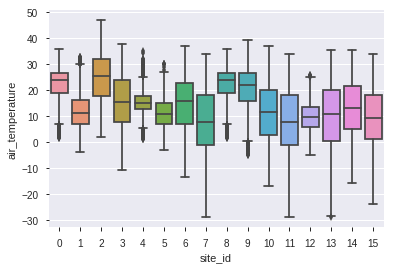

In [14]:
sns.boxplot(x='site_id',y='air_temperature',data=weather_train)

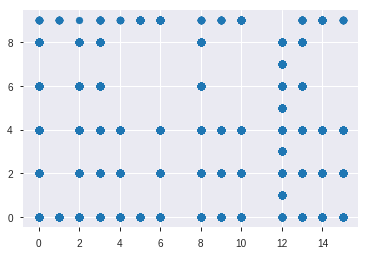

In [15]:
plt.scatter(weather_train.site_id,weather_train.cloud_coverage)

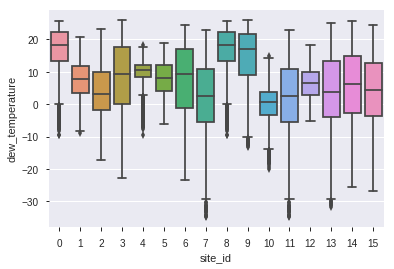

In [16]:
sns.boxplot(x='site_id',y='dew_temperature',data=weather_train)

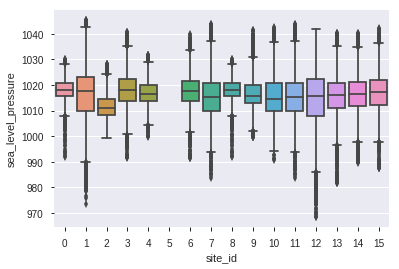

In [17]:
sns.boxplot(x='site_id',y='sea_level_pressure',data=weather_train)

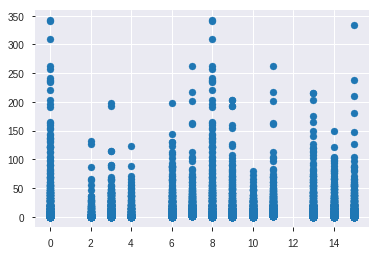

In [18]:
plt.scatter(weather_train.site_id,weather_train.precip_depth_1_hr)

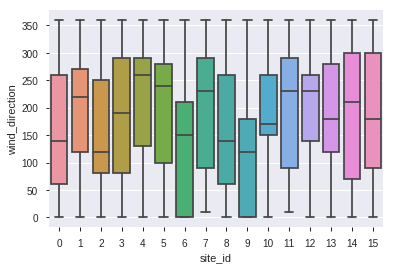

In [19]:
sns.boxplot(x='site_id',y='wind_direction',data=weather_train)

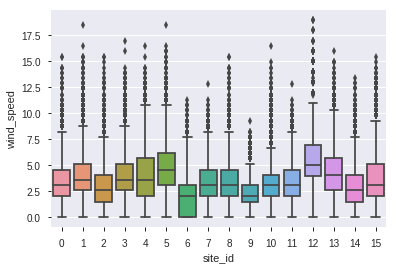

In [20]:
sns.boxplot(x='site_id',y='wind_speed',data=weather_train)

In [21]:
test = pd.read_csv('test.csv', parse_dates = ['timestamp'])

In [22]:
test.head()

,row_id,building_id,meter,timestamp
0,0,0,0,2017-01-01
1,1,1,0,2017-01-01
2,2,2,0,2017-01-01
3,3,3,0,2017-01-01
4,4,4,0,2017-01-01


In [23]:
weather_test = pd.read_csv('weather_test.csv', parse_dates = ['timestamp'])

In [24]:
sample_submission = pd.read_csv('sample_submission.csv')

In [25]:
sample_submission.head()

,row_id,meter_reading
0,0,0
1,1,0
2,2,0
3,3,0
4,4,0


In [26]:
#  Copy for training data --- should be different from the top ones for exploration 
building = pd.read_csv("building_metadata.csv")
weather_train = pd.read_csv("weather_train.csv", index_col=1, parse_dates = True)
train = pd.read_csv("train.csv", index_col=2, parse_dates = True)

In [27]:
print(train.shape)
print(building.shape)
print(weather_train.shape)

(20216100, 3)
(1449, 6)
(139773, 8)


In [28]:
#  Copy for testing data --- should be different from the top ones for exploration 
weather_test = pd.read_csv("weather_test.csv",index_col=1, parse_dates = True)
test = pd.read_csv("test.csv", index_col=3, parse_dates = True)

In [29]:
print(weather_test.shape)
print(test.shape)

(277243, 8)
(41697600, 3)


In [30]:
# Reducing the Memory size of the pandas dataframes helps in easier computation 

def reduce_memory_usage(df, verbose=True):
    numerics = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']
    start_mem = df.memory_usage().sum() / 1024**2    
    for col in df.columns:
        col_type = df[col].dtypes
        if col_type in numerics:
            c_min = df[col].min()
            c_max = df[col].max()
            if str(col_type)[:3] == 'int':
                if c_min > np.iinfo(np.int8).min and c_max < np.iinfo(np.int8).max:
                    df[col] = df[col].astype(np.int8)
                elif c_min > np.iinfo(np.int16).min and c_max < np.iinfo(np.int16).max:
                    df[col] = df[col].astype(np.int16)
                elif c_min > np.iinfo(np.int32).min and c_max < np.iinfo(np.int32).max:
                    df[col] = df[col].astype(np.int32)
                elif c_min > np.iinfo(np.int64).min and c_max < np.iinfo(np.int64).max:
                    df[col] = df[col].astype(np.int64)  
            else:
                if c_min > np.finfo(np.float16).min and c_max < np.finfo(np.float16).max:
                    df[col] = df[col].astype(np.float16)
                elif c_min > np.finfo(np.float32).min and c_max < np.finfo(np.float32).max:
                    df[col] = df[col].astype(np.float32)
                else:
                    df[col] = df[col].astype(np.float64)    
    end_mem = df.memory_usage().sum() / 1024**2
    print('Mem. usage before the memory reduction: {:5.2f} Mb'.format(start_mem))
    if verbose: print('Mem. usage decreased to {:5.2f} Mb ({:.1f}% reduction)'.format(end_mem, 100 * (start_mem - end_mem) / start_mem))
    return df


In [31]:
# Reducing Memory for all the data frames 

# Trainging dataframes 
building = reduce_memory_usage(building)
weather_train = reduce_memory_usage(weather_train)
train = reduce_memory_usage(train)

# Testing Dataframes 
weather_test = reduce_memory_usage(weather_test)
test = reduce_memory_usage(test)

Mem. usage before the memory reduction:  0.07 Mb
Mem. usage decreased to  0.03 Mb (60.3% reduction)
Mem. usage before the memory reduction:  9.60 Mb
Mem. usage decreased to  3.07 Mb (68.1% reduction)
Mem. usage before the memory reduction: 616.95 Mb
Mem. usage decreased to 289.19 Mb (53.1% reduction)
Mem. usage before the memory reduction: 19.04 Mb
Mem. usage decreased to  6.08 Mb (68.1% reduction)
Mem. usage before the memory reduction: 1272.51 Mb
Mem. usage decreased to 596.49 Mb (53.1% reduction)


In [32]:
# Pandas profiling gives a quick summary of the data 
pp.ProfileReport(building)

In [33]:
pp.ProfileReport(weather_train)

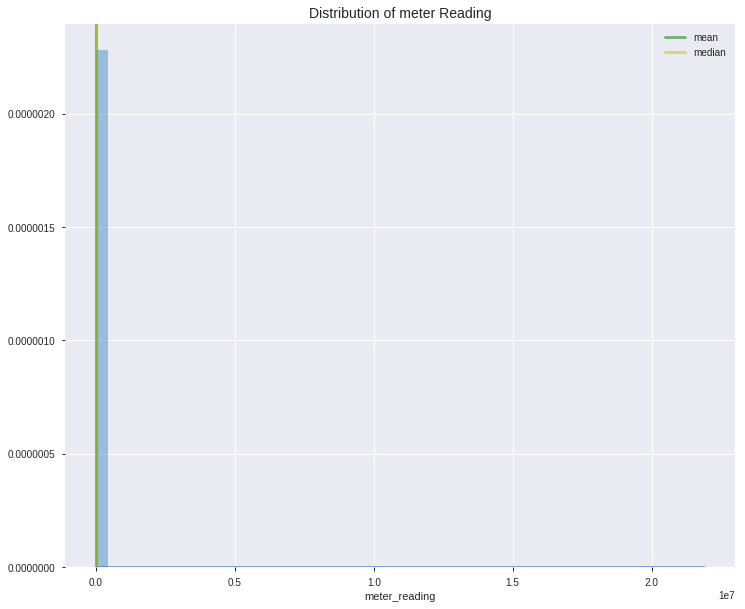

In [34]:
# PP profiler won't work on larger datasets --- so manual exploration for train dataframe 

figsize(12,10)

# histogram, mean and median 
sns.distplot(train['meter_reading'], kde=True )

plt.axvline(x=train.meter_reading.mean(), linewidth=3, color='g', label="mean", alpha=0.5)

plt.axvline(x=train.meter_reading.median(), linewidth=3, color='y', label="median", alpha=0.5)

#  Set title, legends and labels 
plt.title('Distribution of meter Reading', size=14)
plt.legend(["mean", "median"])


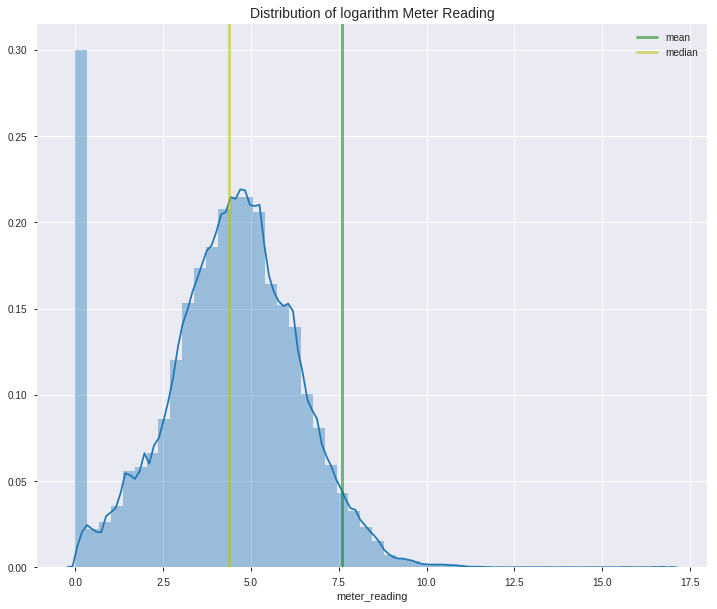

In [35]:
figsize(12,10)

# histogram, mean and median 
sns.distplot(np.log1p(train['meter_reading']), kde=True )

plt.axvline(x=np.log1p(train.meter_reading.mean()), linewidth=3, color='g', label="mean", alpha=0.5)

plt.axvline(x=np.log1p(train.meter_reading.median()), linewidth=3, color='y', label="median", alpha=0.5)

#  Set title, legends and labels 
plt.title('Distribution of logarithm Meter Reading', size=14)

plt.legend(["mean", "median"])

In [36]:
# Exclude the zero meter reading values 

positive_train = train[train['meter_reading'] != 0]
positive_train['log_meter_reading'] = np.log(positive_train['meter_reading'])

In [37]:
positive_train.shape

(18342124, 4)

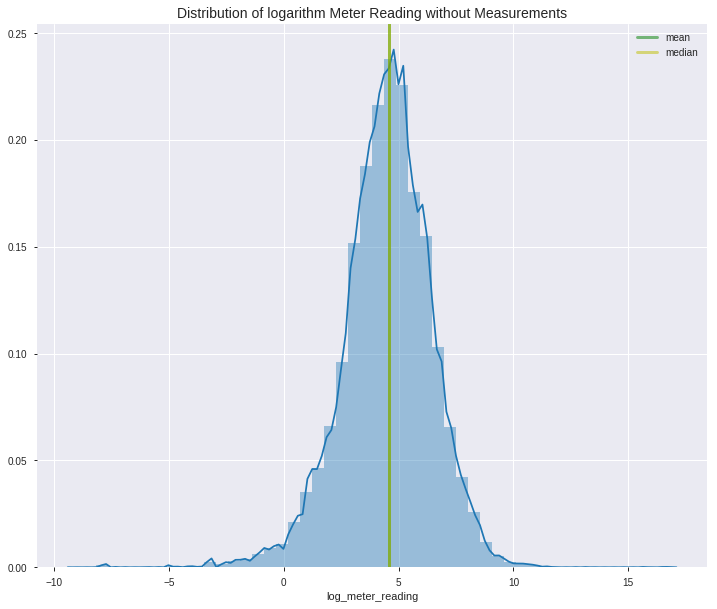

In [38]:
figsize(12,10)

# histogram, mean and median 
sns.distplot(positive_train['log_meter_reading'], kde=True )

plt.axvline(x=positive_train['log_meter_reading'].mean(), linewidth=3, color='g', label="mean", alpha=0.5)

plt.axvline(x=positive_train['log_meter_reading'].median(), linewidth=3, color='y', label="median", alpha=0.5)

#  Set title, legends and labels 
plt.title('Distribution of logarithm Meter Reading without Measurements', size=14)

plt.legend(["mean", "median"])

In [39]:
def outlier_function(df, col_name):
    '''
    this function detects first and third quartile and interquartile range for a given column
    of a dataframe then calculates upper and lower limits to determine outliers conservatively
    return the number of lower and upper limit and number of outliers respectively
    
    '''
    first_quartile = np.percentile(np.array(df[col_name].tolist()),25)

    third_quartile = np.percentile(np.array(df[col_name].tolist()),75)
    
    IQR = third_quartile - first_quartile
    
    upper_limit = third_quartile + (3*IQR)
    lower_limit = first_quartile - (3*IQR)
    outlier_count= 0
    

    for value in df[col_name].tolist():
        if (value < lower_limit ) | (value > upper_limit):
            outlier_count +=1 
    
    return lower_limit, upper_limit, outlier_count    


In [40]:
# percentage of outliers in the reading 
print("{:2f} percent of {} are outliers.".format(((100*outlier_function(train, 'meter_reading')[2])
                                              /len(train['meter_reading'])),'meter_reading'))

7.865538 percent of meter_reading are outliers.


In [41]:
train['meter_reading'].sort_values().tail()

timestamp
2016-06-13 08:00:00   21844500.000
2016-11-09 14:00:00   21847900.000
2016-06-10 08:00:00   21874500.000
2016-06-10 09:00:00   21889900.000
2016-06-13 09:00:00   21904700.000
Name: meter_reading, dtype: float32

In [42]:
positive_train['meter_reading'].sort_values().head()

# even though we have removed a lot of zeros there are plenty of data points which are 
# very close to zero 

timestamp
2016-02-22 19:00:00   0.000
2016-05-31 01:00:00   0.000
2016-02-23 07:00:00   0.000
2016-02-23 02:00:00   0.000
2016-09-25 22:00:00   0.000
Name: meter_reading, dtype: float32

Text(0.5, 1.0, 'Density of Log Meter Reading Values among Different Meters')

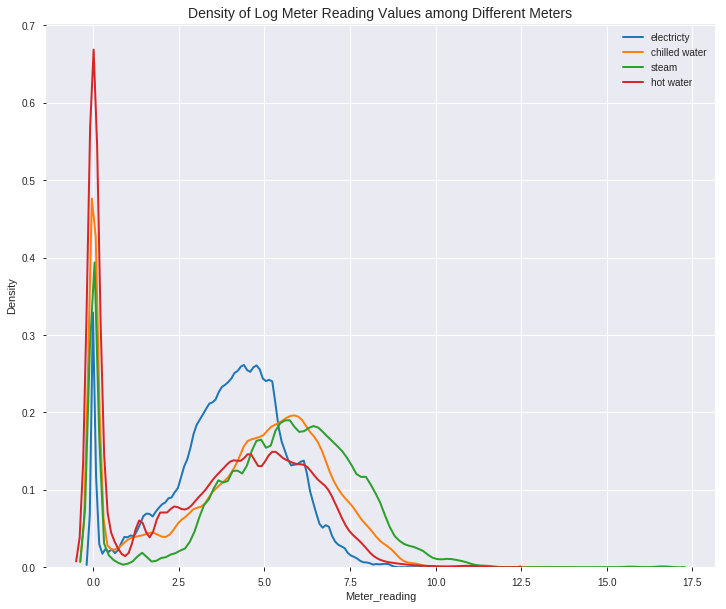

In [43]:
# Distribution of the meter reading in meters with zeros 

figsize(12,10)

# list of different meters 
meters = sorted(train['meter'].unique().tolist())

# plot meter_reading distribution for each meter

for meter_type in meters:
    subset = train[train['meter']== meter_type]
    sns.kdeplot(np.log1p(subset["meter_reading"]),
               label=meter_type, linewidth=2)
    
plt.ylabel("Density")
plt.xlabel("Meter_reading")
plt.legend(['electricty', 'chilled water', 'steam', 'hot water'])
plt.title("Density of Log Meter Reading Values among Different Meters", size=14)

Text(0.5, 1.0, 'Density of Log Postive Meter Reading Values among Different Meters')

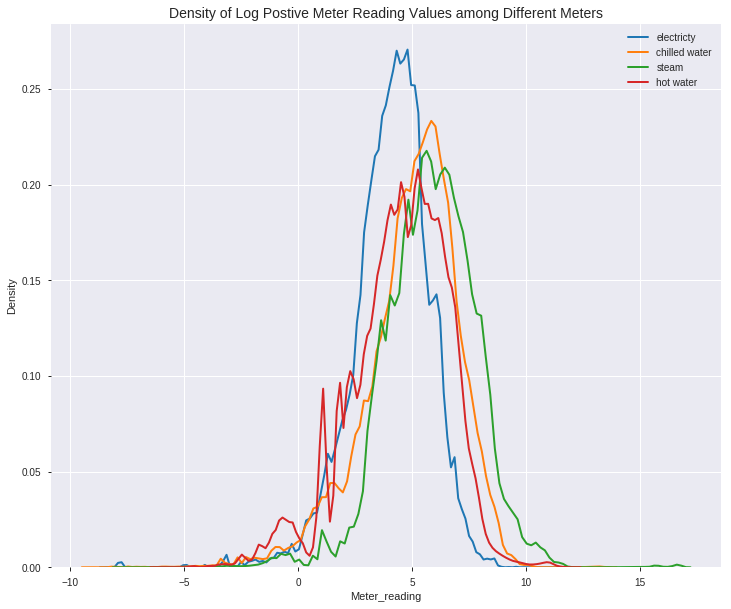

In [45]:
# Distribution of the meter reading in meters without zeros 

figsize(12,10)

# list of different meters 
meters = sorted(train['meter'].unique().tolist())

# plot meter_reading distribution for each meter

for meter_type in meters:
    subset = positive_train[positive_train['meter']== meter_type]
    sns.kdeplot(subset['log_meter_reading'],
               label=meter_type, linewidth=2)
    
plt.ylabel("Density")
plt.xlabel("Meter_reading")
plt.legend(['electricty', 'chilled water', 'steam', 'hot water'])
plt.title("Density of Log Postive Meter Reading Values among Different Meters", size=14)

In [46]:
# downsample hourly observations to daily and aggregate by meter category -- also reset index 

train_daily_avg_by_meter = (train.groupby('meter').meter_reading.
                                resample('d').mean().reset_index())

In [47]:
train_daily_avg_by_meter.head(10)

,meter,timestamp,meter_reading
0,0,2016-01-01,126.716
1,0,2016-01-02,128.755
2,0,2016-01-03,127.367
3,0,2016-01-04,150.324
4,0,2016-01-05,153.210
5,0,2016-01-06,154.542
6,0,2016-01-07,154.364
7,0,2016-01-08,152.045
8,0,2016-01-09,134.462
9,0,2016-01-10,136.389


In [48]:
# Assign meter values as columns to create tidy-form dataframe 

tidy_train_daily_avg = (train_daily_avg_by_meter.pivot(index='timestamp', 
                              columns='meter', values='meter_reading').reset_index())
tidy_train_daily_avg.shape

(366, 5)

In [49]:
tidy_train_daily_avg.head(10)

meter,timestamp,0,1,2,3
0,2016-01-01,126.716,129.533,9147.192,472.831
1,2016-01-02,128.755,132.001,4878.754,586.592
2,2016-01-03,127.367,138.475,4756.754,535.994
3,2016-01-04,150.324,139.168,6480.008,783.455
4,2016-01-05,153.210,134.759,10448.089,719.380
5,2016-01-06,154.542,135.960,17391.121,653.849
6,2016-01-07,154.364,151.979,23521.422,561.519
7,2016-01-08,152.045,153.028,25411.373,554.901
8,2016-01-09,134.462,138.074,20059.088,478.555
9,2016-01-10,136.389,138.508,3173.749,465.096


In [50]:
# rename column header back to meter categories
tidy_train_daily_avg.rename(columns = {0: "electricity",
                                      1: "chilled_water",
                                      2: "steam",
                                      3: "hot_water"},
                           inplace=True)

In [51]:
tidy_train_daily_avg.head(10)

meter,timestamp,electricity,chilled_water,steam,hot_water
0,2016-01-01,126.716,129.533,9147.192,472.831
1,2016-01-02,128.755,132.001,4878.754,586.592
2,2016-01-03,127.367,138.475,4756.754,535.994
3,2016-01-04,150.324,139.168,6480.008,783.455
4,2016-01-05,153.210,134.759,10448.089,719.380
5,2016-01-06,154.542,135.960,17391.121,653.849
6,2016-01-07,154.364,151.979,23521.422,561.519
7,2016-01-08,152.045,153.028,25411.373,554.901
8,2016-01-09,134.462,138.074,20059.088,478.555
9,2016-01-10,136.389,138.508,3173.749,465.096


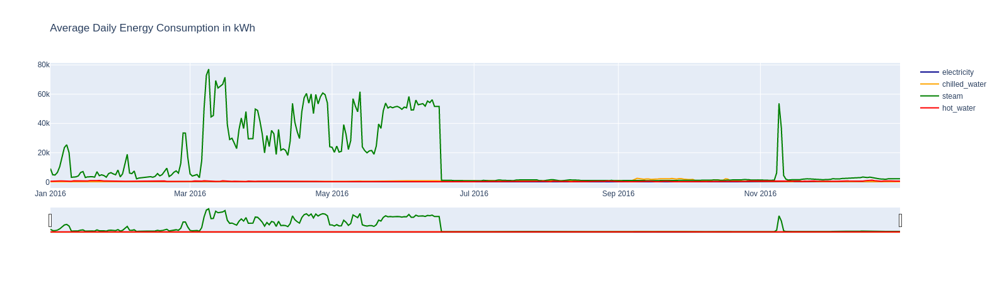

In [52]:
# create a meter and color dictionary 

meter_dict = {'electricity':'darkblue',
              'chilled_water':'orange',
              'steam':'green',
              'hot_water':'red'
             }

# figure object and plot each meter category 
fig = go.Figure()

for key in meter_dict:
    fig.add_trace(go.Line(x=tidy_train_daily_avg.timestamp,
                          y=tidy_train_daily_avg[key],
                          name = key, line_color=meter_dict[key]))

# add title and show figure
fig.update_layout(title_text='Average Daily Energy Consumption in kWh', 
                 xaxis_rangeslider_visible=True)
# Image(filename='newplot.png') 
fig.show()

#### Steam has the highest consumption 0-80,000kwh , steam is only utilized in the first half of the year 

In [53]:
### Weather Dataframe 

In [54]:
# upsample weather_train dataframe to get daily means 

weather_train_daily_avg = (weather_train.resample('d').mean())
weather_train_daily_avg.shape

(366, 8)

In [55]:
weather_train_daily_avg.head(10)

,site_id,air_temperature,cloud_coverage,dew_temperature,precip_depth_1_hr,sea_level_pressure,wind_direction,wind_speed
timestamp,,,,,,,,
2016-01-01,7.288,5.367,2.184,0.467,0.063,1019.500,173.500,3.689
2016-01-02,7.340,5.340,1.988,-0.323,-0.033,1016.500,201.250,4.016
2016-01-03,7.332,5.480,1.970,0.240,0.528,1012.000,205.500,3.928
2016-01-04,7.165,4.125,1.972,-1.981,0.281,1012.000,226.750,3.709
2016-01-05,7.109,3.768,1.859,-1.520,0.529,1016.500,184.750,4.133
2016-01-06,7.267,3.861,2.254,-0.441,0.661,1018.000,168.500,3.195
2016-01-07,7.326,5.062,3.648,1.532,1.229,1014.500,168.375,3.100
2016-01-08,7.320,5.336,3.316,3.033,0.792,1013.500,122.250,2.340
2016-01-09,7.500,6.113,5.039,3.684,0.322,1013.000,124.062,3.256


In [56]:
# align weather train dataframe with the train_daily_avg dataframe 
weather_train_daily_avg.reset_index(inplace=True)
weather_train_daily_avg.shape

(366, 9)

In [57]:
weather_train_daily_avg.head(10)

,timestamp,site_id,air_temperature,cloud_coverage,dew_temperature,precip_depth_1_hr,sea_level_pressure,wind_direction,wind_speed
0,2016-01-01,7.288,5.367,2.184,0.467,0.063,1019.500,173.500,3.689
1,2016-01-02,7.340,5.340,1.988,-0.323,-0.033,1016.500,201.250,4.016
2,2016-01-03,7.332,5.480,1.970,0.240,0.528,1012.000,205.500,3.928
3,2016-01-04,7.165,4.125,1.972,-1.981,0.281,1012.000,226.750,3.709
4,2016-01-05,7.109,3.768,1.859,-1.520,0.529,1016.500,184.750,4.133
5,2016-01-06,7.267,3.861,2.254,-0.441,0.661,1018.000,168.500,3.195
6,2016-01-07,7.326,5.062,3.648,1.532,1.229,1014.500,168.375,3.100
7,2016-01-08,7.320,5.336,3.316,3.033,0.792,1013.500,122.250,2.340
8,2016-01-09,7.500,6.113,5.039,3.684,0.322,1013.000,124.062,3.256
9,2016-01-10,7.448,6.559,2.639,3.498,3.756,1009.000,173.125,4.246


In [58]:
# Now we Merge both the weather and train_daily avg datasets 

weather_vs_meter_reading = (train_daily_avg_by_meter.merge(weather_train_daily_avg,
                                                          on='timestamp', how='left'))


In [59]:
weather_vs_meter_reading.shape

(1464, 11)

In [60]:
weather_vs_meter_reading.head(10)

,meter,timestamp,meter_reading,site_id,air_temperature,cloud_coverage,dew_temperature,precip_depth_1_hr,sea_level_pressure,wind_direction,wind_speed
0,0,2016-01-01,126.716,7.288,5.367,2.184,0.467,0.063,1019.500,173.500,3.689
1,0,2016-01-02,128.755,7.340,5.340,1.988,-0.323,-0.033,1016.500,201.250,4.016
2,0,2016-01-03,127.367,7.332,5.480,1.970,0.240,0.528,1012.000,205.500,3.928
3,0,2016-01-04,150.324,7.165,4.125,1.972,-1.981,0.281,1012.000,226.750,3.709
4,0,2016-01-05,153.210,7.109,3.768,1.859,-1.520,0.529,1016.500,184.750,4.133
5,0,2016-01-06,154.542,7.267,3.861,2.254,-0.441,0.661,1018.000,168.500,3.195
6,0,2016-01-07,154.364,7.326,5.062,3.648,1.532,1.229,1014.500,168.375,3.100
7,0,2016-01-08,152.045,7.320,5.336,3.316,3.033,0.792,1013.500,122.250,2.340
8,0,2016-01-09,134.462,7.500,6.113,5.039,3.684,0.322,1013.000,124.062,3.256
9,0,2016-01-10,136.389,7.448,6.559,2.639,3.498,3.756,1009.000,173.125,4.246


In [61]:
# rename meter column
weather_vs_meter_reading['meter'] = (weather_vs_meter_reading['meter'].
                                     map({0: 'electricity',
                                          1: 'chilled_water',
                                          2: 'steam',
                                          3: 'hot_water'}))

In [62]:
weather_vs_meter_reading.head(10)

,meter,timestamp,meter_reading,site_id,air_temperature,cloud_coverage,dew_temperature,precip_depth_1_hr,sea_level_pressure,wind_direction,wind_speed
0,electricity,2016-01-01,126.716,7.288,5.367,2.184,0.467,0.063,1019.500,173.500,3.689
1,electricity,2016-01-02,128.755,7.340,5.340,1.988,-0.323,-0.033,1016.500,201.250,4.016
2,electricity,2016-01-03,127.367,7.332,5.480,1.970,0.240,0.528,1012.000,205.500,3.928
3,electricity,2016-01-04,150.324,7.165,4.125,1.972,-1.981,0.281,1012.000,226.750,3.709
4,electricity,2016-01-05,153.210,7.109,3.768,1.859,-1.520,0.529,1016.500,184.750,4.133
5,electricity,2016-01-06,154.542,7.267,3.861,2.254,-0.441,0.661,1018.000,168.500,3.195
6,electricity,2016-01-07,154.364,7.326,5.062,3.648,1.532,1.229,1014.500,168.375,3.100
7,electricity,2016-01-08,152.045,7.320,5.336,3.316,3.033,0.792,1013.500,122.250,2.340
8,electricity,2016-01-09,134.462,7.500,6.113,5.039,3.684,0.322,1013.000,124.062,3.256
9,electricity,2016-01-10,136.389,7.448,6.559,2.639,3.498,3.756,1009.000,173.125,4.246


In [63]:
# create weather variables and color dictionary
weather_dict = {"air_temperature": "red",
               "cloud_coverage": "orange",
               "dew_temperature": "coral",
                "precip_depth_1_hr": "olive",
                "sea_level_pressure": "teal",
                "wind_direction": "purple",
                "wind_speed": "navy" 
               }


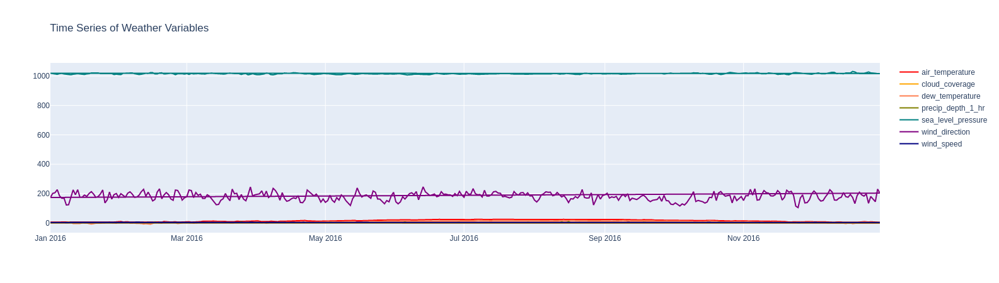

In [64]:
# create plotly object and plot weather variables against dates
fig = go.Figure()
    
for key in weather_dict:
    fig.add_trace(go
                  .Line(x=weather_vs_meter_reading['timestamp'],
                        y=weather_vs_meter_reading[key], 
                        name=key,
                        line_color=weather_dict[key]))
    
fig.update_layout(title_text='Time Series of Weather Variables')
# Image(filename='newer+plot.png') 
fig.show()


##### dew_temperature is lower than air temperature but trend seems to be the same, 
##### sea_level_pressure seems to be consistent over the year , Avg wind speed seems 

##### is around 3.5 and varies values throughout the year.  

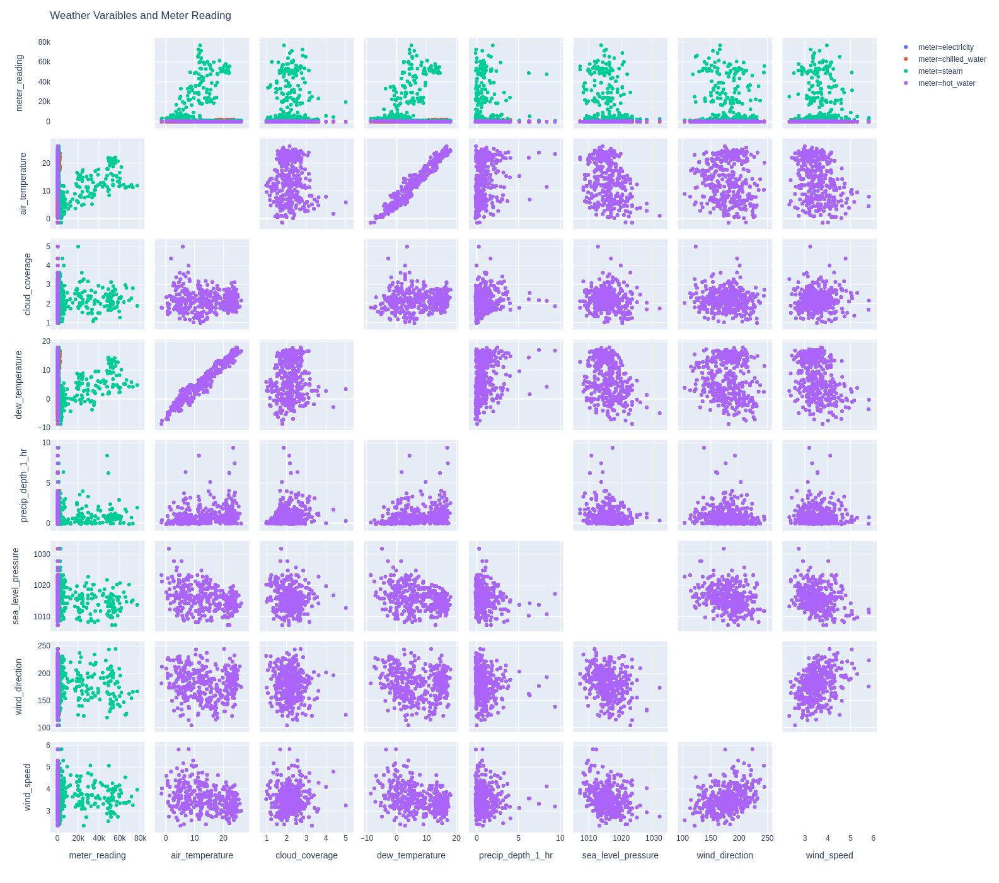

In [66]:
# Understanding the relationship correlation between meter_reading and 
# weather related variables 


fig = px.scatter_matrix(weather_vs_meter_reading,
                        dimensions=["meter_reading",
                                    "air_temperature",
                                    "cloud_coverage",
                                    "dew_temperature",
                                    "precip_depth_1_hr",
                                    "sea_level_pressure",
                                    "wind_direction",
                                    "wind_speed"],
                        color="meter")

fig.update_layout(
    title='Weather Varaibles and Meter Reading',
    dragmode='select',
    width=1400,
    height=1400,
    hovermode='closest')

fig.update_traces(diagonal_visible=False,)
# Image(filename='newplot_2.png') 
fig.show()

In [67]:
# Electricity 
# As the air and dew temperature goes up, electricity consumption increases.
# Cloud coverage, sea level pressure, precip depth 1 hour shows positive trend with the electricity consumption. Although their correlations are not as strong as temperature variables.
# Wind direction and wind speed has almost no effect in electricity consumption

In [68]:
# Chilled water:
# As the air and dew temperature rises, chilled water consumption increases.
# Other weather variables shows a slightly weaker positive trend with chilled water consumption, compared to air variables.

In [69]:
# steam:
# Although the data range is wider and higher than the weather variables, air temperature, dew temperature and cloud coverage shows positive trend with the steam consumption.
# Precip depth 1 hour have a small effect (with a positive trend) in determining the steam consumption.
# Rest of the weather variables does not significantly impacting steam consumption.

In [70]:
# Hot water:
# Other weather variables shows positive trend with the hot water consumption.
# Air and dew temprature shows negative trend with the hot water consumption.

# One other important observation is air and dew temperature are highly collinear. 
# All of the weather variables whether it is slight or strong seems to have an affect on energy consumption.

In [71]:
# Prepare and Merge Datasets 
# Meter Readings 

# group train dataset per building and meter category
train_by_building = (train.groupby(["building_id", "meter"]).meter_reading.mean().
                     reset_index())

train_by_building.shape

(2380, 3)

In [72]:
train_by_building.head(20) 

,building_id,meter,meter_reading
0,0,0,146.455
1,1,0,74.865
2,2,0,14.551
3,3,0,235.550
4,4,0,976.557
5,5,0,17.894
6,6,0,64.067
7,7,0,350.334
8,7,1,3097.044
9,8,0,256.928


In [73]:
# merge grouped train dataframe with building dataset
building_w_meter_reading = (train_by_building.merge(building, on='building_id', 
                                  how='left'))
building_w_meter_reading.shape

(2380, 8)

In [74]:
building_w_meter_reading.head(10)

,building_id,meter,meter_reading,site_id,primary_use,square_feet,year_built,floor_count
0,0,0,146.455,0,Education,7432,2008.000,nan
1,1,0,74.865,0,Education,2720,2004.000,nan
2,2,0,14.551,0,Education,5376,1991.000,nan
3,3,0,235.550,0,Education,23685,2002.000,nan
4,4,0,976.557,0,Education,116607,1975.000,nan
5,5,0,17.894,0,Education,8000,2000.000,nan
6,6,0,64.067,0,Lodging/residential,27926,1981.000,nan
7,7,0,350.334,0,Education,121074,1989.000,nan
8,7,1,3097.044,0,Education,121074,1989.000,nan
9,8,0,256.928,0,Education,60809,2003.000,nan


In [75]:
# 80 % of the primary use values where of the top 5 - Education, Office, Entertainment, 
# Public service, Lodging/residential

In [76]:
# Add a column that has the log values of meter_reading 
building_w_meter_reading['log_meter_reading'] = np.log1p(building_w_meter_reading['meter_reading'])

In [77]:
# Map primary use column to be encoded


building_w_meter_reading['primary_use_mapped'] = (building_w_meter_reading['primary_use'].
                                                  map({'Office': 'Office',
                                                        'Education': 'Education',
                                                        'Entertainment/public assembly':'Entertainment/public',
                                                        'Lodging/residential': 'Residential',
                                                        'Public services': 'Public services'
                                                       }))


In [78]:
# replace the rest with Other
building_w_meter_reading['primary_use_mapped'].replace(np.nan, 
                                                       'Other', 
                                                       regex=True, 
                                                       inplace=True)

In [79]:
building_w_meter_reading['meter'] = (building_w_meter_reading['meter'].
                                     map({0: 'electricity',
                                          1: 'chilled_water',
                                          2: 'steam',
                                          3: 'hot_water'
                                         }))

In [80]:
building_w_meter_reading.head(10)

,building_id,meter,meter_reading,site_id,primary_use,square_feet,year_built,floor_count,log_meter_reading,primary_use_mapped
0,0,electricity,146.455,0,Education,7432,2008.000,nan,4.994,Education
1,1,electricity,74.865,0,Education,2720,2004.000,nan,4.329,Education
2,2,electricity,14.551,0,Education,5376,1991.000,nan,2.744,Education
3,3,electricity,235.550,0,Education,23685,2002.000,nan,5.466,Education
4,4,electricity,976.557,0,Education,116607,1975.000,nan,6.885,Education
5,5,electricity,17.894,0,Education,8000,2000.000,nan,2.939,Education
6,6,electricity,64.067,0,Lodging/residential,27926,1981.000,nan,4.175,Residential
7,7,electricity,350.334,0,Education,121074,1989.000,nan,5.862,Education
8,7,chilled_water,3097.044,0,Education,121074,1989.000,nan,8.039,Education
9,8,electricity,256.928,0,Education,60809,2003.000,nan,5.553,Education


In [81]:
# split building_w_meter_reading dataset per primary use category
education = (building_w_meter_reading[building_w_meter_reading[
    'primary_use_mapped'] == 'Education'])

office = (building_w_meter_reading[building_w_meter_reading[
    'primary_use_mapped'] == 'Office'])

entertainment_public = (building_w_meter_reading[building_w_meter_reading[
    'primary_use_mapped'] == 'Entertainment/public'])

residential = (building_w_meter_reading[building_w_meter_reading[
    'primary_use_mapped'] == 'Residential'])

public_services = (building_w_meter_reading[building_w_meter_reading[
    'primary_use_mapped'] == 'Public services'])

other = (building_w_meter_reading[building_w_meter_reading[
    'primary_use_mapped'] == 'Other'])

In [82]:
education.head(10)

,building_id,meter,meter_reading,site_id,primary_use,square_feet,year_built,floor_count,log_meter_reading,primary_use_mapped
0,0,electricity,146.455,0,Education,7432,2008.000,nan,4.994,Education
1,1,electricity,74.865,0,Education,2720,2004.000,nan,4.329,Education
2,2,electricity,14.551,0,Education,5376,1991.000,nan,2.744,Education
3,3,electricity,235.550,0,Education,23685,2002.000,nan,5.466,Education
4,4,electricity,976.557,0,Education,116607,1975.000,nan,6.885,Education
5,5,electricity,17.894,0,Education,8000,2000.000,nan,2.939,Education
7,7,electricity,350.334,0,Education,121074,1989.000,nan,5.862,Education
8,7,chilled_water,3097.044,0,Education,121074,1989.000,nan,8.039,Education
9,8,electricity,256.928,0,Education,60809,2003.000,nan,5.553,Education
13,11,electricity,296.393,0,Education,49073,1968.000,nan,5.695,Education


In [83]:
# create distplot parameters as lists
hist_data = [education['log_meter_reading'], 
             office['log_meter_reading'],
             entertainment_public['log_meter_reading'],
             residential['log_meter_reading'],
             public_services['log_meter_reading'],
             other['log_meter_reading']]

group_labels = ['education', 'office', 'entertainment_public',
               'residential', 'public_services', 'other' ]

colors = ['#333F44', '#37AA9C', '#94F3E4', '#66CCFF', '#2C89AB', '#0324A9']

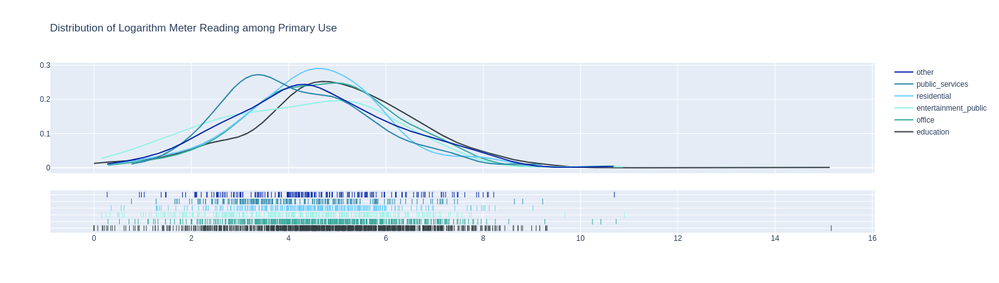

In [84]:
# create KDE plot of log_meter_reading 
fig = ff.create_distplot(hist_data, group_labels, 
                         show_hist=False, colors=colors, show_rug=True)
fig.update_layout(title_text='Distribution of Logarithm Meter Reading among Primary Use')
# Image(filename='newplot_3.png')
fig.show()

In [85]:
# All primary_use categories shows uni-modal distirbution.
# Log_meter_reading values greater than 10 are visualized as outliers 
# almost in all primary use categories.

# It seems primary_use has significant importance in determining meter_reading_values 


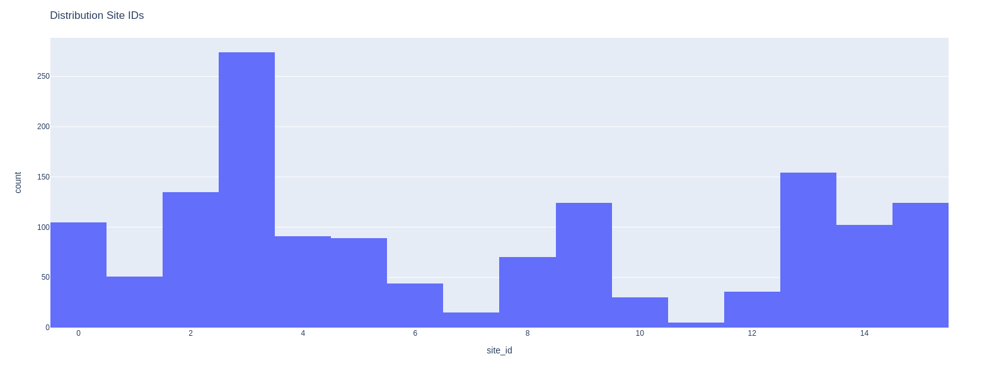

In [86]:
# histogram of site_ids
fig = px.histogram(building, x="site_id")
fig.update_layout(title_text='Distribution Site IDs')
# Image(filename='newplot_4.png')
fig.show()

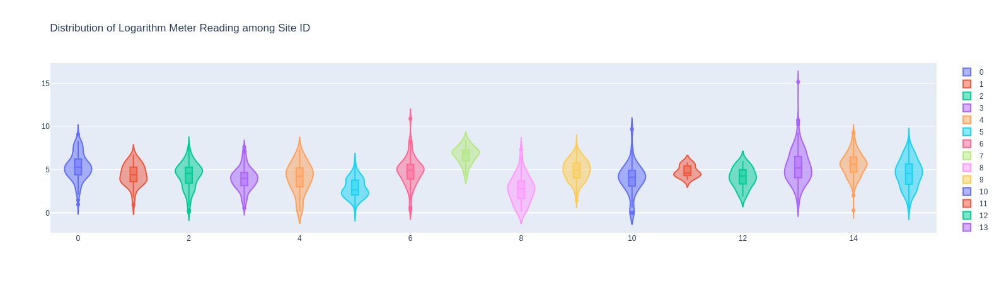

In [87]:
# create site id list
site_ids = building_w_meter_reading.site_id.unique().tolist()

# create plotly object and visualize the distribution
fig = go.Figure()

# add a violin plot for each site_id
for site_id in site_ids:
    fig.add_trace(go.Violin(y=building_w_meter_reading
                            [building_w_meter_reading['site_id'] == site_id]
                            ['log_meter_reading'],
                            name=site_id,
                            box_visible=True))

# set title and show the object
fig.update_layout(title_text='Distribution of Logarithm Meter Reading among Site ID')
# Image(filename='newplot_5.png')
fig.show()

In [88]:
building_w_meter_reading['meter_reading'].shape

(2380,)

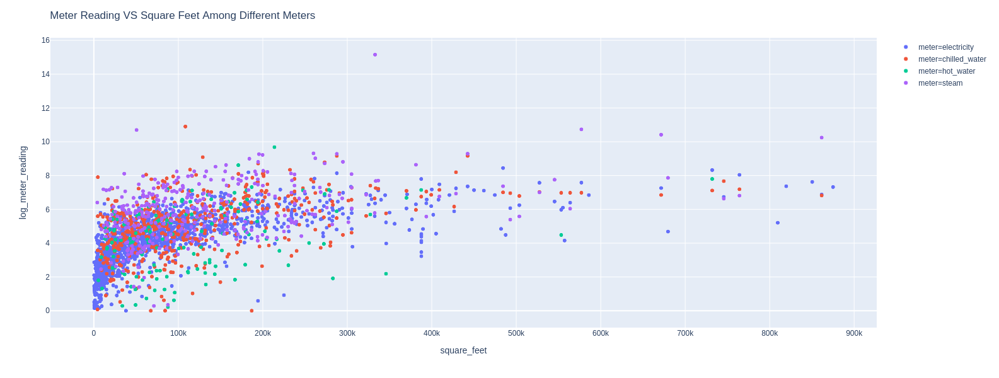

In [89]:
# Scatter plot of meter reading Vs Square feet 

fig = px.scatter(building_w_meter_reading, x="square_feet", y="log_meter_reading", 
                 color="meter", hover_data=['meter_reading'])

fig.update_layout(title_text='Meter Reading VS Square Feet Among Different Meters')
# Image(filename='newplot _6.png')
fig.show()

In [90]:
# There is a clear connectcion between square feet and meter_reading values in all categories. 
# As the building size increases energy consumption of the building increases.

In [91]:
# Add an age column

currentYear = datetime.now().year
building_w_meter_reading['age'] = currentYear - building_w_meter_reading['year_built']

In [92]:
building_w_meter_reading.head()

,building_id,meter,meter_reading,site_id,primary_use,square_feet,year_built,floor_count,log_meter_reading,primary_use_mapped,age
0,0,electricity,146.455,0,Education,7432,2008.000,nan,4.994,Education,11.000
1,1,electricity,74.865,0,Education,2720,2004.000,nan,4.329,Education,15.000
2,2,electricity,14.551,0,Education,5376,1991.000,nan,2.744,Education,28.000
3,3,electricity,235.550,0,Education,23685,2002.000,nan,5.466,Education,17.000
4,4,electricity,976.557,0,Education,116607,1975.000,nan,6.885,Education,44.000


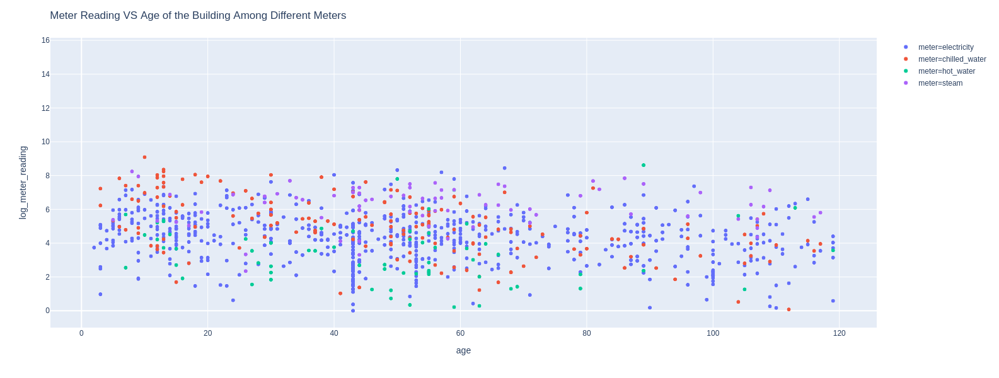

In [93]:
fig = px.scatter(building_w_meter_reading, x="age", y="log_meter_reading",
                 color="meter", hover_data=['meter_reading'])

fig.update_layout(title_text='Meter Reading VS Age of the Building Among Different Meters')
# Image(filename='newplot_7.png')
fig.show()

In [94]:
# Pearson Coefficients of weather and building dataset 

# A Pearson correlation is a number between -1 and 1 that 
# indicates the extent to which two variables are linearly related.
# (source) So as it gets closer to 1 or -1, the correlation gets stronger.




# reorder building columns
column_list = building_w_meter_reading.columns.tolist()
column_list = ['building_id',
 'site_id',
 'meter',
 'primary_use',
 'primary_use_mapped',
 'year_built',
 'age',
 'square_feet',
 'floor_count',
 'meter_reading',
 'log_meter_reading']


In [95]:
# assign reordered building columns back to building
building_w_meter_reading = building_w_meter_reading[column_list]

Text(0.5, 1.0, 'Pearson Correlation of Building Features with Meter Reading')

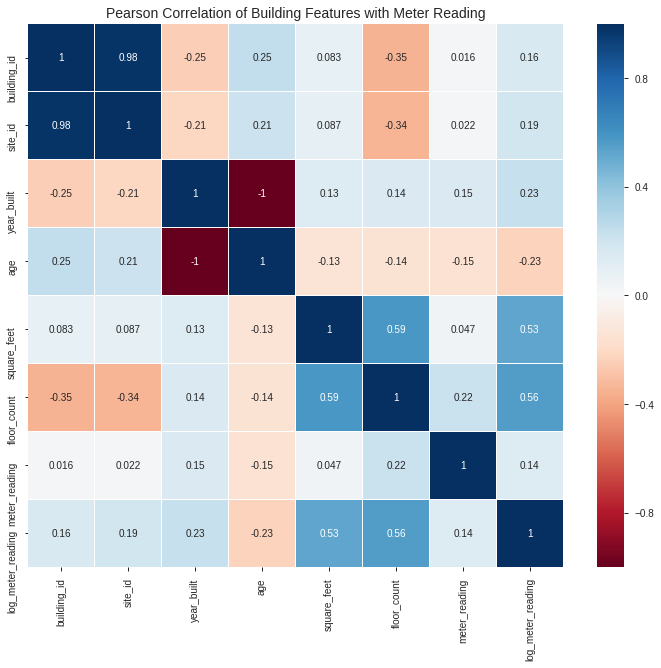

In [96]:
# pearson coefficients with numeric soil type column
correlations = pd.DataFrame(building_w_meter_reading.corr())

figsize=(20,16)

# plot the heatmap
colormap = plt.cm.RdBu
sns.heatmap(correlations,linewidths=0.1, 
            square=False, cmap=colormap, linecolor='white', annot=True)
plt.title('Pearson Correlation of Building Features with Meter Reading', size=14)

In [97]:
# One interesting finding from the heatmap of building features vs meter 
# reading is log_meter_reading values have stronger correlantions compared to meter_reading values.

In [98]:
# Floor_count column will be kept due to its high pearson coefficeint and it will be imputed. 
# Primary use, site id, year built (or age), square feet has a significant effect in 
# determining meter reading values which also intuitively makes sense

In [99]:
# Although some weather variables has a slight impact in determining the meter 
# reading values, those variables will be used for feature engineering and addition. 
# Air and dew temperature are highly collinear.